# Исследование рынка заведений общественного питания Москвы

**Цель исследования:** провести исследования рынка для выявление наиболее перспективных для открытия типов завадений общественного питания, их расположения, меню и цен.

**Исходные данные:** датасет `moscow_places.csv` с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, носит исключительно справочный характер.

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

 

**План выполения исследования:** 
1. Загрузка датасета, первичный обзор данных.
2. Переработка данных: вычисление новых столбцов, проверка и очистка данных от выбросов и дубликатов.
3. Исследование данных в разбивке по категориям заведений общественного питания: какие типы заведений есть и какое у них соотношение, сколько в них посадочных мест; сравнение сетевых и не сетевых заведений.
4. Исследование данных в разбивке по административным округам: составление средних рейтингов и чеков, категории по районам, создание катр с кластерами. Составление топ-15 улиц.
5. Детализированное исследование кофеен: распределение кофеен по районам, их рейтинги, сетевые кофейни и средние цены на чашку кофе.
6. Выводы по исследованию и составление рекомендаций. Презентация полученных результатов. 

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Первичный-обзор-данных" data-toc-modified-id="Первичный-обзор-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Первичный обзор данных</a></span></li><li><span><a href="#Переработка-данных" data-toc-modified-id="Переработка-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Переработка данных</a></span></li><li><span><a href="#Исследовательский-анализ-данных" data-toc-modified-id="Исследовательский-анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Исследовательский анализ данных</a></span><ul class="toc-item"><li><span><a href="#Исследование-данных-по-категориям-заведений" data-toc-modified-id="Исследование-данных-по-категориям-заведений-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Исследование данных по категориям заведений</a></span></li><li><span><a href="#Исследование-данных-о-географическом-расположении-заведений" data-toc-modified-id="Исследование-данных-о-географическом-расположении-заведений-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Исследование данных о географическом расположении заведений</a></span></li><li><span><a href="#Исследование-улиц,-на-которых-находится-только-один-объект-общепита" data-toc-modified-id="Исследование-улиц,-на-которых-находится-только-один-объект-общепита-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Исследование улиц, на которых находится только один объект общепита</a></span></li></ul></li><li><span><a href="#Детализированное-исследование:-открытие-кофейни" data-toc-modified-id="Детализированное-исследование:-открытие-кофейни-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Детализированное исследование: открытие кофейни</a></span></li><li><span><a href="#Выводы" data-toc-modified-id="Выводы-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Выводы</a></span><ul class="toc-item"><li><span><a href="#Выводы-по-общему-исследованию" data-toc-modified-id="Выводы-по-общему-исследованию-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Выводы по общему исследованию</a></span></li><li><span><a href="#Выводы-по-исследованию-кофеен" data-toc-modified-id="Выводы-по-исследованию-кофеен-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Выводы по исследованию кофеен</a></span></li><li><span><a href="#Рекомендации-по-открытию-кофейни" data-toc-modified-id="Рекомендации-по-открытию-кофейни-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Рекомендации по открытию кофейни</a></span></li></ul></li></ul></div>

## Первичный обзор данных

In [1]:
# импорт библиотек

import pandas as pd
import seaborn as sns
import numpy as np
import datetime as dt
from numpy import median
from scipy import stats as st

import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.io as pio
import plotly.express as px

import warnings
from pandas.core.common import SettingWithCopyWarning
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)

import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [2]:
try:
    data = pd.read_csv('moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
    
data.head()    

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Промежуточные итоги:** датасет содержит информацию о 8406 заведениях разных типов. Данные необходимо проверить на наличие дубликатов, а также заполнить пропуски там, где это возможно.

## Переработка данных

In [4]:
# проверка данных на дубликаты 

data.duplicated().sum()

0

In [5]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [6]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [7]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

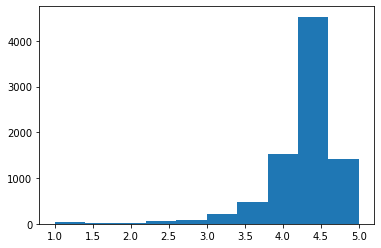

In [8]:
# проверка данных на выбросы 

plt.hist(data['rating']);

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

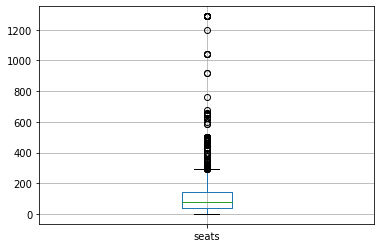

In [9]:
#plt.hist(data['seats']);

data.boxplot(['seats']);
data['seats'].describe()

#data_clear = data.query('seats < 400 or seats.isnull()')

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64


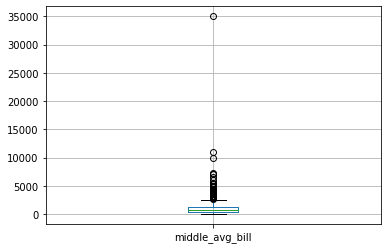

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

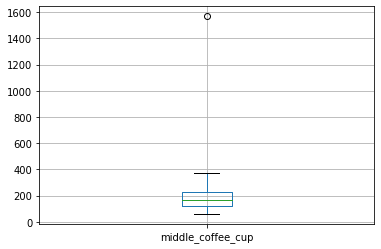

In [10]:
#plt.hist(data['middle_avg_bill']);
#plt.show()
data.boxplot(['middle_avg_bill']);
print(data['middle_avg_bill'].describe())
plt.show()

data.boxplot(['middle_coffee_cup']);
data['middle_coffee_cup'].describe()

#data_clear = data_clear.query('(middle_avg_bill < 2500 or middle_avg_bill.isnull()) and (middle_coffee_cup < 400 or middle_coffee_cup.isnull())')

In [11]:
# проверим заведения со слишком большими чеками
data.query('middle_avg_bill > 10000')
data.query('middle_coffee_cup > 1400')

# Шоколадница - сетевая кофейня, скорее всего была допущена ошибка в заполнении столбцов avg_bill
# и middle_coffee_cup, поэтому данную кофейню в анализ не будем включать
data_clear = data.query('middle_coffee_cup < 1000 or middle_coffee_cup.isnull()')

In [12]:
# добавление новых столбцов

# функция добавления столбца о круглосуточной работе
def is_24(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    else:
        return False

data_clear['is_24/7'] = data['hours'].apply(is_24)

# функция добавления столбца с названием улицы
def street(address):
    if address.find('улица') >= 10:
        string = address[:address.find('улица')].split(',')[1]
        return string
    elif 0 < address.find('улица') < 10:
        string = address[address.find('улица')+len('улица'):].split(',')[0]
        return string
    else:
        return np.nan

# data_clear['street'] = data_clear['address'].apply(street)  

data_clear['street'] = data_clear['address'].str.split(', ').str[1]

data_clear.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False,Правобережная улица


In [13]:
print(round(data_clear.shape[0] / data.shape[0] * 100, 2))

99.99


In [14]:
data = data_clear

**Промежуточные итоги:** данные были проверены на наличие дубликатов, их не было обнаружено; существующие в датасете пропуски заполнить не представляется возможным; проведена проверка на выбросы в данных. После очистки объем датасета составил 99.99% от изначального. Добавлены столбцы `street` с названиями улиц из адреса и `is_24/7` с информацией о круглосуточной работе заведения.

## Исследовательский анализ данных

### Исследование данных по категориям заведений

In [15]:
data_category = data.groupby('category').agg({'name':'count'}).sort_values(by = 'name', ascending = False).reset_index()
data_category['percent_of_all'] =  round(data_category['name'] / data_category['name'].sum() * 100, 2)
data_category

,category,name,percent_of_all
0,кафе,2378,28.29
1,ресторан,2043,24.31
2,кофейня,1412,16.80
3,"бар,паб",765,9.10
4,пиццерия,633,7.53
5,быстрое питание,603,7.17
6,столовая,315,3.75
7,булочная,256,3.05


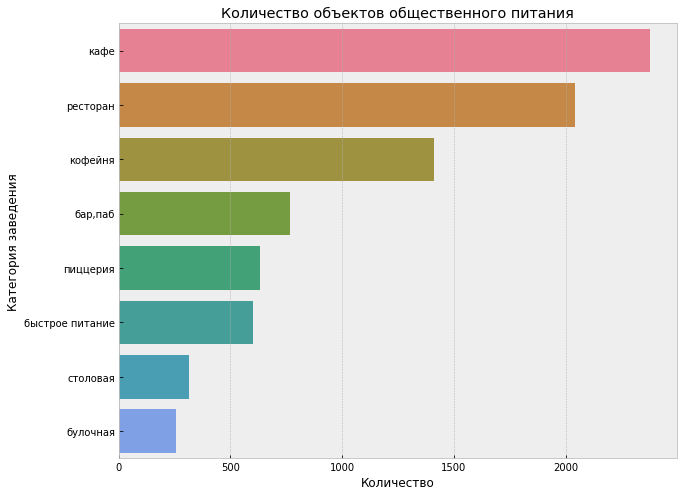

In [16]:
# задаем стили графиков
plt.style.use('bmh')
current_palette  = sns.color_palette("husl", 10)
sns.set_palette(current_palette) 

plt.figure(figsize = (10, 8))
ax = sns.barplot(y = 'category', x ='name', data = data_category) 
plt.title('Количество объектов общественного питания')
plt.xlabel('Количество')
plt.ylabel('Категория заведения');

Больше всего кафе: их количество превосходит 2300 штук. На втором месте рестораны, а на третьем - кофейни. Остальных заведений меньше в несколько раз по сравнению с топ-3 категориями.

In [17]:
#fig = px.histogram(data_category, y = 'category', x ='name', text_auto = True)
#fig.show()

In [18]:
pio.templates.default = 'ggplot2'

fig = go.Figure(data=[go.Pie(labels=data_category['category'], 
                             values=data_category['percent_of_all'])])
fig.update_layout(title='Соотношение типов заведений в датасете',
                  width=700, 
                  height=500)

In [19]:
#plt.figure(figsize = (8, 6))
#ax = sns.barplot(x = 'category', y = 'seats', data = data)
#plt.title('Количество посадочных мест')
#plt.ylabel('Количество')
#plt.xlabel('Категория заведения')
#plt.xticks(rotation=30);

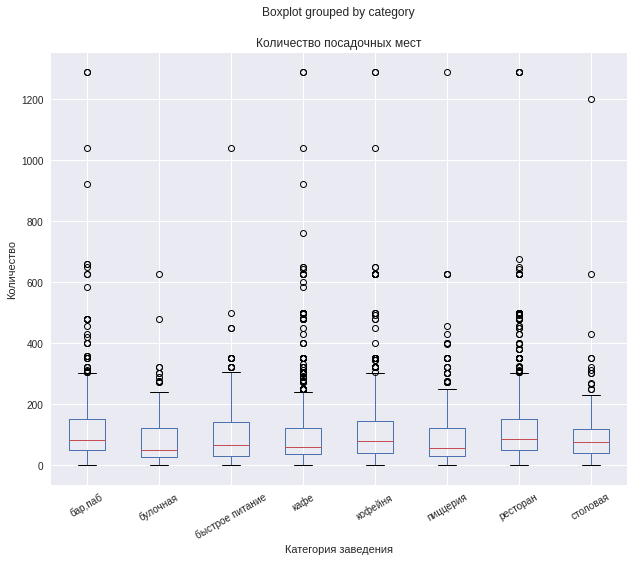

In [20]:
plt.style.use('seaborn')

data.boxplot(column = ['seats'], by = 'category', figsize = (10, 8));
plt.title('Количество посадочных мест')
plt.ylabel('Количество')
plt.xlabel('Категория заведения')
plt.xticks(rotation=30);

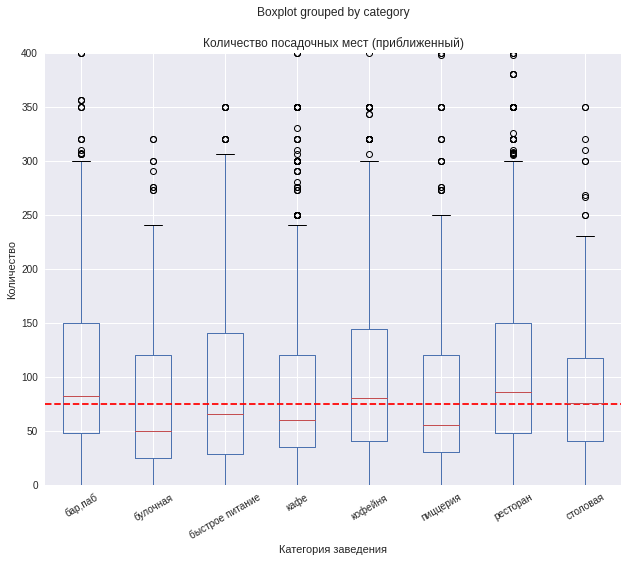

In [21]:
data.boxplot(column = ['seats'], by = 'category', figsize = (10, 8));
plt.title('Количество посадочных мест (приближенный)')
plt.ylabel('Количество')
plt.xlabel('Категория заведения')
plt.xticks(rotation=30)
plt.ylim(0, 400)
plt.axhline(y=data['seats'].median(), color='r', linestyle='--');

По числу посадочных мест лидируют рестораны и бары. Меньше всего мест в булочных, кафе и пиццериях. Среднее медианное значение количества посадочных мест по заведениям составляет 75 штук.

In [22]:
# изменение формата вывода по сетевым заведениям
data_name = data.groupby('chain')['name'].count().reset_index()
data_name['chain'] = data_name['chain'].astype('string')
data_name['chain'] = data_name['chain'].replace('0', 'не сетевой')
data_name['chain'] = data_name['chain'].replace('1', 'сетевой')

pio.templates.default = 'ggplot2'

fig = go.Figure(data=[go.Pie(labels=data_name['chain'], 
                             values=data_name['name'])])
fig.update_layout(title='Соотношение сетевых и не сетевых заведений',
                  width=700, 
                  height=500)

Не сетевых заведений значительно больше: 86% не сетевых к 14% сетевых. Однако, если учитывать все филиалы сетевых заведений, то это соотношение меняется: 61.4% не сетевых к 36,8% сетевых.

In [23]:
data_name = data
data_name['chain'] = data_name['chain'].astype('string')
data_name['chain'] = data_name['chain'].replace('0', 'не сетевой')
data_name['chain'] = data_name['chain'].replace('1', 'сетевой')
fig = px.histogram(data_name, x = 'category', color = 'chain').update_xaxes(categoryorder="total descending")
fig.update_layout(title='Соотношение сетевых и не сетевых заведений по группам',
                  width=700, 
                  height=500, 
                  xaxis_title='Категория заведения',
                  yaxis_title='Количество')

У кофеен, булочных и пиццерий преобладают сетевые заведения, а у всех остальных категорий - не сетевые. Наименьшее соотношение сетевых к не сетевым заведениям у баров и пабов - похоже, их владельцы любят оригинальность.

In [24]:
data_chain = data.query('chain == "сетевой"').groupby('category').agg({'name':'count'}).reset_index()
data_chain = data_chain.merge(data_category, on = 'category')
data_chain = data_chain.drop(['percent_of_all'], axis = 1)
data_chain.columns = ['category', 'chain', 'total']
data_chain['chain_percent'] = round(data_chain['chain'] / data_chain['total'] * 100, 2)
data_chain = data_chain.sort_values(by = 'chain_percent', ascending = False)
data_chain

,category,chain,total,chain_percent
1,булочная,157,256,61.33
5,пиццерия,330,633,52.13
4,кофейня,719,1412,50.92
2,быстрое питание,232,603,38.47
6,ресторан,730,2043,35.73
3,кафе,779,2378,32.76
7,столовая,88,315,27.94
0,"бар,паб",169,765,22.09


In [25]:
fig = px.bar(data_chain, 
             x = 'category', y = 'chain_percent', 
             text=(round(data_chain['chain_percent'], 2))).update_xaxes(categoryorder="total descending")
fig.update_layout(title='Процент сетевых заведений по категориям',
                  width=700, 
                  height=500, 
                  xaxis_title='Категория заведения',
                  yaxis_title='Процент')

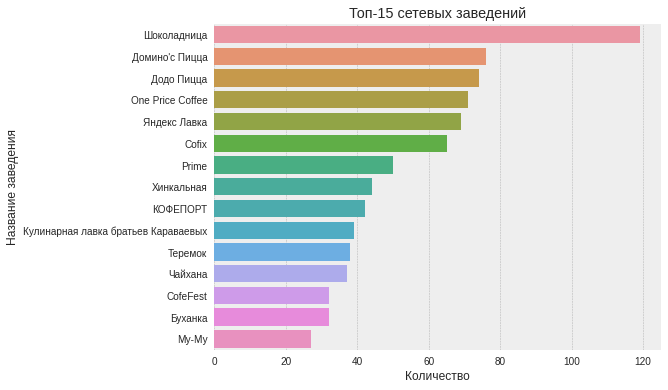

In [26]:
plt.style.use('bmh')

data_top15 = (
    data
    .query('chain == "сетевой"')
    .groupby('name')['address'].count()
    .sort_values(ascending = False)
    .head(15)
    .reset_index()
)

plt.figure(figsize = (8, 6))
ax = sns.barplot(data=data_top15, y = 'name', x = 'address')
plt.title('Топ-15 сетевых заведений')
plt.xlabel('Количество')
plt.ylabel('Название заведения'); 

Больше всего заведений у таких сетей, как Шоколадница (более 100 точек), Доминос Пицца и Додо Пицца (порядка 75 точек), One Price Coffee и Cofix (порядка 60 точек). Это соотносится с данными из предыдущего графика - практически все топовые сети относятся либо к категориям пиццерии, либо к кофейням.

In [27]:
data.query('name == "Кафе"').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,не сетевой,NaN,False,Ижорская улица
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,не сетевой,35.0,False,улица Маршала Федоренко
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,не сетевой,NaN,False,МКАД
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,не сетевой,50.0,False,Шенкурский проезд
141,Кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,не сетевой,70.0,False,Дубнинская улица


In [28]:
def det_distr(df):
    return df.split(' ')[0]

data_temp = data.copy()
#data_temp['district'] = data_temp['district'].apply(det_distr)
fig = px.histogram(data_temp, y = 'district', color = 'category').update_yaxes(categoryorder="total ascending")
fig.update_layout(title='Категории заведений по округам',
                  width=900, 
                  height=500, 
                  yaxis_title='Округ',
                  xaxis_title='Количество')

Заведений в Центральном районе как минимум в 2 раза больше, чем в остальных: это понятно, ведь там наиболее интенсивный поток людей. Меньше всего заведений в Северно-Западном районе. Можно предположить, что это связано с чем, что он считается самым "зеленым" районом Москвы - там много парковых территорий, где сосредоточено меньше людей и других точек интереснов (магазинов, музеев, БЦ и т.д.). В остальных районах находится примерно одинаковое количество заведений общественного питация - в диапазоне от 600 до 800. Также интересно то, что, если смотреть на количество заведений по категориям, относительно других районов в центральном расположено больше всего ресторанов, кофеен и баров. В остальных категориях открыв не такой большой. 

Для большей наглядости построим график доли каждого типа заведения внутри каждого округа.

In [29]:
# создадим датасет с долями каждого типа заведений относительно каждого округа

data_district = data.groupby(['district', 'category']).agg({'name':'count'}).reset_index()
data_temp = data.groupby('district').agg({'name':'count'}).reset_index()
data_district = data_district.merge(data_temp, on = 'district')
data_district.columns = ['district', 'category', 'count', 'total']
data_district['percent_of_all'] = round(data_district['count'] / data_district['total'] * 100, 1)

pio.templates.default = "plotly"

fig = px.histogram(data_district, y = 'district', x = 'percent_of_all', color = 'category')
fig.update_layout(title='Относительное распределение категорий заведений по округам',
                  width=1200, 
                  height=500, 
                  yaxis_title='Округ',
                  xaxis_title='Количество')

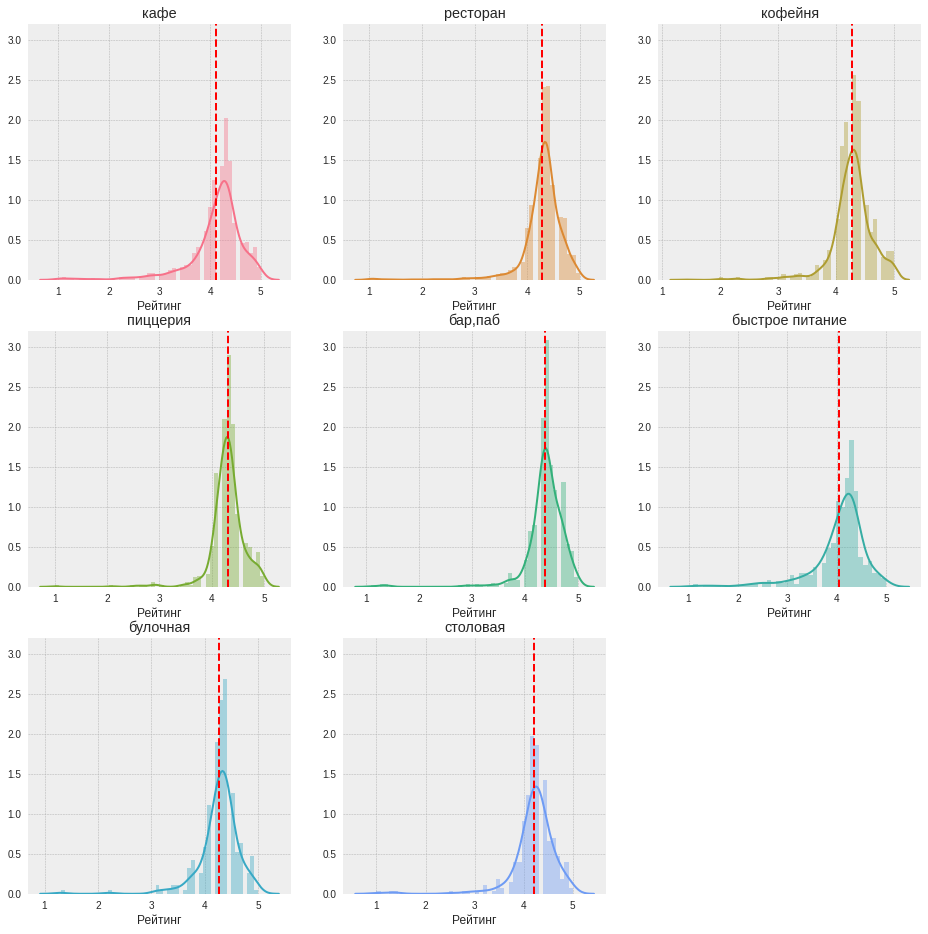

In [30]:
current_palette  = sns.color_palette("husl", 10)
sns.set_palette(current_palette) 

i = 0
plt.figure(figsize = (16,16))
for category in data['category'].unique():
    ax = plt.subplot(3, 3, i+1)
    sns.distplot(data.loc[data['category'] == category, 'rating'], color = current_palette[i])
    plt.title(category)
    plt.xlabel('Рейтинг')
    plt.ylim(0, 3.2)
    plt.ylabel('')
    plt.axvline(x=data.loc[data['category'] == category, 'rating'].mean(), color='r', linestyle='--');
    i +=1

У всех типов заведений распределение оценок нормальное, но смещенное вправо. Если смотреть медианное значение рейтингов, то категории заведений не сильно различаются по оценкам: они все в районе 4.2 - 4.3 баллов. Наиболее низкие рейтинги у столовых, кафе и заведений быстрого питания, а самый высокий - у баров и пабов.

In [31]:
data_category = data.groupby('category').agg({'rating':'mean'}).sort_values(by = 'rating', ascending = False).reset_index()
data_category['rating'] = round(data_category['rating'], 2)
data_category.columns = ['категория', 'средний рейтинг']
data_category

,категория,средний рейтинг
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


### Исследование данных о географическом расположении заведений

In [32]:
# загружаем данные о границах округов в Москве 

with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
    
data_rating = data.groupby('district', as_index=False)['rating'].agg('median')  

In [33]:
# строим визуализацию медианного рейтигна по районам

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data = state_geo,
    data = data_rating ,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'PuBuGn',
    fill_opacity = 0.6,
    legend_name = 'Медианный рейтинг заведений по районам',
).add_to(m)

m

Заведения с самыми высокими оценками расположены в Центральном округе, а с самыми низкими - в Северо-Восточном и Юго-Восточном округах.

In [34]:
# кластеризация всех заведений в датасете

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# функция для создания маркеров
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)
m

In [35]:
data_top15 = data.groupby('street')['name'].count().sort_values(ascending = False).head(15)

data_top_street = data.query('street.isin(@data_top15.index)')

fig = px.histogram(data_top_street, y = 'street', color = 'category').update_yaxes(categoryorder = "total ascending")
fig.update_layout(title='Топ-15 улиц по числу заведений',
                  width=900, 
                  height=500, 
                  yaxis_title='Улица',
                  xaxis_title='Количество')

In [36]:
data_top15.reset_index()

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Больше всего заведений на Профсоюзной улице, проспекте Мира, Вернадского и Ленинском. Однако, в данном случае судить по абсолютным показателям не совсем корректно - улицы имеют разную протяженность. 

In [37]:
data_top_street_2 = data_top_street.groupby('street')['name'].count().sort_values(ascending = False).reset_index()

# данные о длине улиц (км)
street_len = pd.DataFrame([8.9, 9.3, 8, 16, 5.6, 15.5, 10.5, 22.5, 19.7, 108.9, 8.6, 4.9, 8.9, 3.6, 1.8])

df = data_top_street_2.join(street_len)
df.columns = ['address', 'count', 'len']

# расчет количества заведений на км
df['concentration'] = round(df['count'] / df['len'])

pio.templates.default = 'ggplot2'

fig = px.histogram(df, y = 'address', x = 'concentration').update_yaxes(categoryorder = "total ascending")
fig.update_layout(title='Топ-15 по количеству заведений на 1 км',
                  width=900, 
                  height=500, 
                  yaxis_title='Улица',
                  xaxis_title='Количество')

In [38]:
df

,address,count,len,concentration
0,проспект Мира,184,8.9,21.0
1,Профсоюзная улица,122,9.3,13.0
2,проспект Вернадского,108,8.0,14.0
3,Ленинский проспект,107,16.0,7.0
4,Ленинградский проспект,95,5.6,17.0
5,Дмитровское шоссе,88,15.5,6.0
6,Каширское шоссе,77,10.5,7.0
7,Варшавское шоссе,76,22.5,3.0
8,Ленинградское шоссе,70,19.7,4.0
9,МКАД,65,108.9,1.0


А вот по концентрации заведений на 1 км картина немного меняется: в лидерах появляются улица Миклухо-Маклая, Пятницкая, но в целом тенденция остается похожей: на лидирующих по количеству заведений проспеклах Мира, Ленинградском и проспекте Вернадского заведений на 1 км достаточно много.

In [39]:
# строим визуализацию медианного среднего чека по районам

data_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')  

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data = state_geo,
    data = data_avg_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color = 'PuBu',
    fill_opacity = 0.6,
    legend_name = 'Медианный средний чек по районам',
).add_to(m)

m

Самый дорогой средний чек в Центральном и Западном округах, а самый бюджетный - в Северо-Восточном, Юго-Восточном и Южном округах. Стоит помнить, что рейтинг расположенных там заведений ниже, чем в остальных районах Москвы.

In [40]:
data_avg_bill.columns = ['округ', 'средний счет']
data_avg_bill

,округ,средний счет
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


### Исследование улиц, на которых находится только один объект общепита

In [41]:
# улицы, на которых только одно заведение

data_one = data.groupby('street')['name'].count().reset_index()
data_one = data_one.loc[data_one['name'] == 1, 'street']
data_one = data.query('street.isin(@data_one)')
data_not_one = data.query('not street.isin(@data_one)')

In [42]:
print('Улиц, на которых только одно заведение:', data_one.shape[0])
print('Из всего датасета таких улиц относительно остальных, %:', round(data_one.shape[0]/data_not_one.shape[0] * 100, 2))

Улиц, на которых только одно заведение: 458
Из всего датасета таких улиц относительно остальных, %: 5.45


Проверим несколько гипотез.

```
h_0 = Средний рейтинг единственных на улице заведений = средний рейтинг не единственных на улице заведений
h_1 = Средний рейтинг единственных на улице заведений ≠ средний рейтинг не единственных на улице заведений
alpha = 0.05
```

In [43]:
alpha = .05 # критический уровень статистической значимости

results = st.ttest_ind(
    data_one['rating'], 
    data_not_one['rating'])

print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу") 

p-значение: 0.7635918249932712
Не получилось отвергнуть нулевую гипотезу


```
h_0 = Средний чек единственных на улице заведений = средний чек не единственных на улице заведений
h_1 = Средний чек единственных на улице заведений ≠ средний чек не единственных на улице заведений
alpha = 0.05
```

In [44]:
results = st.ttest_ind(
    data_one['middle_avg_bill'].dropna(), 
    data_not_one['middle_avg_bill'].dropna())

print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу") 

p-значение: 0.9824154002010062
Не получилось отвергнуть нулевую гипотезу


```
h_0 = Средняя стоимость чашки капучино единственных на улице заведений = средняя стоимость чашки капучино не единственных на улице заведений
h_1 = Средняя стоимость чашки капучино единственных на улице заведений ≠ средняя стоимость чашки капучино не единственных на улице заведений
alpha = 0.05
```

In [45]:
results = st.ttest_ind(
    data_one['middle_coffee_cup'].dropna(), 
    data_not_one['middle_coffee_cup'].dropna())

print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу") 

p-значение: 0.30076892981881387
Не получилось отвергнуть нулевую гипотезу


По результатам проверки этих двух гипотез можно сделать вывод, что существенных различий между заведениями, которые являются единственным объектом общепита на всей улице, и всеми остальными нет.

## Детализированное исследование: открытие кофейни

In [46]:
data_coffee = data.query('category == "кофейня"')
data_not_coffee = data.query('category != "кофейня"')

In [47]:
fig = go.Figure(data=[go.Pie(labels=['кофейня', 'все остальные заведения'], 
                             values=[data_coffee.shape[0], data_not_coffee.shape[0]])])
fig.update_layout(title='Соотношение количества кофеен и заведений остальных типов',
                  width=700, 
                  height=500)

Из всех представленных в датасете заведений 16.8% являются кофейнями. 

In [48]:
fig = px.histogram(data_coffee, y = 'district', color = 'chain').update_yaxes(categoryorder = "total ascending")
fig.update_layout(title='Кофейни по округам',
                  width=900, 
                  height=500, 
                  yaxis_title='Округ',
                  xaxis_title='Количество')

Больше всего кофеен в Центральном округе, как и остальных заведений. Меньше всего - в Северо-Западном. Соотношение сетевых к не сетевым кофейням составляет примерно 50/50 по всем округам.

In [49]:
fig = px.histogram(data_coffee, y = 'is_24/7')
fig.update_layout(title='Круглосуточные кофейни',
                  width=700, 
                  height=300, 
                  yaxis_title='',
                  xaxis_title='Количество')

Практически все кофейни работают не круглосуточно. Из всех 1413 кофеен в датасете только в 59 можно будет взять кофе ночью.

In [50]:
# функция для укрупнения диапазонов рейтингов кофеен

def coffee_rait(data):
    if data < 3:
        return '3 и ниже'
    if 3.5 >= data >= 3:
        return '3 - 3.5'
    if 4 >= data > 3.5:
        return '3.5 - 4'
    if 4.5 >= data > 4:
        return '4 - 4.5'
    if 4.9 >= data > 4.5:
        return '4.5 - 4.9'
    else:
        return '5'
    
data_coffee['rating_2'] = data_coffee['rating'].apply(coffee_rait)

In [51]:
# кофейни по а.о.

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
data_coffee.apply(create_clusters, axis=1)
m

In [52]:
fig = px.histogram(data_coffee, y = 'district', color = 'rating_2').update_yaxes(categoryorder = "total ascending")
fig.update_layout(title='Рейтинг кофеен по округам',
                  width=900, 
                  height=500, 
                  yaxis_title='Округ',
                  xaxis_title='Количество')

In [53]:
data_coffee_rating = data_coffee.groupby('district', as_index=False)['rating'].agg('mean')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data = state_geo,
    data = data_coffee_rating,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'PuBuGn',
    fill_opacity = 0.6,
    legend_name = 'Средний рейтинг кофеен по районам',
).add_to(m)

m

Кофейни с самыми высокими оценками расположены в Центральном и Северо-Западном округах, а с самым низким - в Западном и Северо-Восточном. Однако разброс по средним рейтингам не слишком велик - от 4.2 до 4.34. Больше всего кофеен с наивысшим рейтингом расположены в Северном округе.

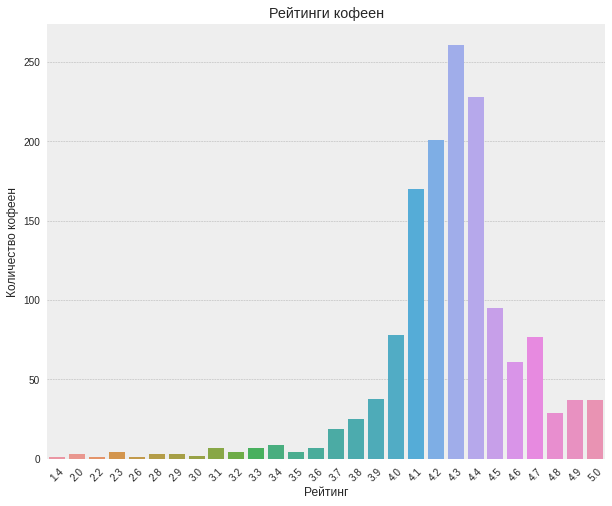

In [54]:
data_temp = data_coffee.groupby('rating').agg({'name':'count'}).reset_index()

plt.figure(figsize = (10, 8))
ax = sns.barplot(x = 'rating', y = 'name', data = data_temp)
plt.title('Рейтинги кофеен')
plt.ylabel('Количество кофеен')
plt.xlabel('Рейтинг')
plt.xticks(rotation=45);

Большая часть кофеен в каждом округе имеет рейтинг в диапазоне 4 - 4.5. Больше всего кофеен с рейтингом 4.3, а некоторые кофейни имеют рейтинг даже ниже 3-х баллов, но их гораздо меньше, чем, например, кофеен с наивысшим рейтингом.

In [55]:
# кофейни с рейтингом 5

data_coffee_5 = data_coffee.query('rating == 5 or rating == 4.9')

print('Из кофеен с рейтингами 4.9 и 5', round(data_coffee_5.query('chain == "не сетевой"').shape[0] / data_coffee_5.shape[0] * 100), '% являются не сетевыми.')

Из кофеен с рейтингами 4.9 и 5 78 % являются не сетевыми.


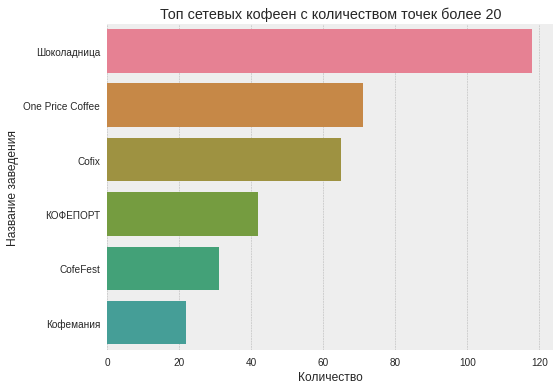

In [56]:
coffee_top = (
    data_coffee
    .groupby('name')['address'].count()
    .sort_values(ascending = False).head(6)
    .reset_index()
)

current_palette  = sns.color_palette("husl", 10)
sns.set_palette(current_palette)

plt.figure(figsize = (8, 6))
ax = sns.barplot(data=coffee_top, y = 'name', x = 'address') 
plt.title('Топ сетевых кофеен с количеством точек более 20')
plt.xlabel('Количество')
plt.ylabel('Название заведения'); 

Топовыми сетями являются Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ, CofeFest и Кофемания: у каждой из них у всех более 20 точек по всему городу. Примечательно, что 2 из 5 сетей - это сети фиксированных цен, которые работают в более низкой ценивой категории, чем остальные лидеры.

In [57]:
data_middle_coffee_cup = data_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')  

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data = state_geo,
    data = data_middle_coffee_cup,
    columns = ['district', 'middle_coffee_cup'],
    key_on = 'feature.name',
    fill_color = 'PuBu',
    fill_opacity = 0.6,
    legend_name = 'Медианная средняя стоимость чашки капучино по районам',
).add_to(m)

m

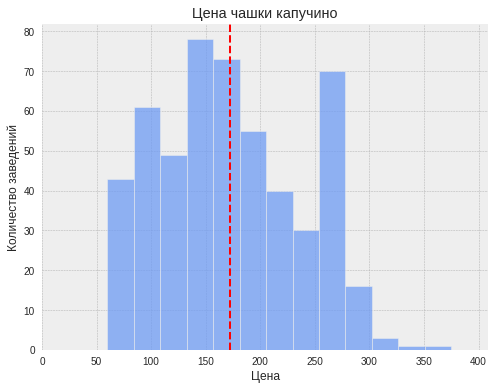

In [58]:
plt.figure(figsize = (8, 6))

ax = sns.histplot(x='middle_coffee_cup', data=data_coffee, color = current_palette[7]) 
plt.title('Цена чашки капучино')
plt.xlabel('Цена')
plt.xlim(0,409)
plt.ylabel('Количество заведений')
plt.axvline(data_coffee['middle_coffee_cup'].mean(), color='r', linestyle='--'); 

Разброс цен за чашку капучино достаточно большой: есть много более дешевых кофеен с ценником 100 рублей, так и более дорогих, где цена начинается от 200. В среднем цена составляет 170 рублей. Интересная особенность Западного а.о.: там одна из самых высоких медианных цен за чашку капучино, но при этом медианный рейтинг кофеен ниже, чем в районах с более дешевым кофе.

In [59]:
# проверим, есть ли корреляция между рейтингом кофейни и ценами в ней

data_coffee_corr = data_coffee.dropna(subset=['middle_coffee_cup'])
data_coffee_corr['middle_coffee_cup'].corr(data_coffee_corr['rating'])

0.1455376705712903

## Выводы

### Выводы по общему исследованию
1. Проанализирован датасет, содержащий информацию о 8406 заведениях разных типов. В ходе переработки данные проверены на наличие дубликатов, их не было обнаружено; существующие в датасете пропуски заполнены не были; проведена проверка на выбросы в данных. После очистки объем датасета составил 99.99% от изначального. Добавлены столбцы street с названиями улиц из адреса и is_24/7 с информацией о круглосуточной работе заведения.
2. В Москве больше всего кафе: их количество превосходит 2300 штук. На втором месте рестораны, а на третьем - кофейни. Остальных заведений меньше в несколько раз по сравнению с топ-3 категориями.
3. По числу посадочных мест лидируют рестораны и бары. Меньше всего мест в булочных, кафе и пиццериях. Среднее медианное значение количества посадочных мест по заведениям составляет 75 штук.
4. Не сетевых заведений значительно больше: 86% не сетевых к 14% сетевых. Однако, если учитывать все филиалы сетевых заведений, то это соотношение меняется: 61.4% не сетевых к 36,8% сетевых. У кофеен, булочных и пиццерий преобладают сетевые заведения, а у всех остальных категорий - не сетевые. Наименьшее соотношение сетевых к не сетевым заведениям у баров и пабов - похоже, их владельцы любят оригинальность.
5. Больше всего заведений у таких сетей, как Шоколадница (более 100 точек), Доминос Пицца и Додо Пицца (порядка 75 точек), One Price Coffee и Cofix (порядка 60 точек). Это соотносится с ранее полученными данными: практически все топовые сети относятся либо к категориям пиццерии, либо к кофейням.
6. Заведений в Центральном районе как минимум в 2 раза больше, чем в остальных: это понятно, ведь там наиболее интенсивный поток людей. Меньше всего заведений в Северно-Западном районе. Можно предположить, что это связано с чем, что он считается самым "зеленым" районом Москвы - там много парковых территорий, где сосредоточено меньше людей и других точек интереснов (магазинов, музеев, БЦ и т.д.). В остальных районах находится примерно одинаковое количество заведений общественного питация - в диапазоне от 600 до 800. Также интересно то, что, если смотреть на количество заведений по категориям, относительно других районов в центральном расположено больше всего ресторанов, кофеен и баров. В остальных категориях открыв не такой большой.
7. У всех типов заведений распределение оценок нормальное, но смещенное вправо. Если смотреть медианное значение рейтингов, то категории заведений не сильно различаются по оценкам: они все в районе 4.2 - 4.3 баллов. Наиболее низкие рейтинги у столовых и заведений быстрого питания, а самый высокий - у баров и пабов. Заведения с самыми высокими оценками расположены в Центральном округе, а с самыми низкими - в Северо-Восточном и Юго-Восточном округах. 
8. Больше всего заведений на Профсоюзной улице, проспекте Мира, Вернадского и Ленинском. Самый дорогой средний чек в Центральном и Западном округах, а самый бюджетный - в Северо-Восточном, Юго-Восточном и Южном округах. Стоит помнить, что рейтинг расположенных там заведений ниже, чем в остальных районах Москвы.
9. Число улиц, на которых только одно заведение: 458, это 5.45% от всех улиц в датасете. При проверке гипотез статистически значимых различий между заведениями, которые на них располагаются, и всеми остальными не было обнаружено.

### Выводы по исследованию кофеен 
1. Из всех представленных в датасете заведений 16.8% являются кофейнями.
2. Больше всего кофеен в Центральном округе, как и остальных заведений. Меньше всего - в Северо-Западном. Соотношение сетевых к не сетевым кофейням составляет примерно 50/50 по всем округам.
3. Практически все кофейни работают не круглосуточно. Из всех 1413 кофеен в датасете только в 59 можно будет взять кофе ночью.
4. Кофейни с самыми высокими оценками расположены в Центральном и Северо-Западном округах, а с самым низким - в Западном и Северо-Восточном. Однако разброс по средним рейтингам не слишком велик - от 4.2 до 4.34. Больше всего кофеен с наивысшим рейтингом расположены в Северном округе.
5. Большая часть кофеен в каждом округе имеет рейтинг в диапазоне 4 - 4.5. Больше всего кофеен с рейтингом 4.3, а некоторые кофейни имеют рейтинг даже ниже 3-х баллов, но их гораздо меньше, чем, например, кофеен с наивысшим рейтингом. Цены в меню практически не влияют на итоговый рейтинг кофейни.
6. Топовыми сетями являются Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ, CofeFest и Кофемания: у каждой из них у всех более 20 точек по всему городу. Примечательно, что 2 из 5 сетей - это сети фиксированных цен, которые работают в более низкой ценивой категории, чем остальные лидеры.
7. Разброс цен за чашку капучино достаточно большой: есть много более дешевых кофеен с ценником 100 рублей, так и более дорогих, где цена начинается от 200. В среднем цена составляет 170 рублей. Интересная особенность Западного а.о.: там одна из самых высоких медианных цен за чашку капучино, но при этом медианный рейтинг кофеен ниже, чем в районах с более дешевым кофе.

### Рекомендации по открытию кофейни

Возможно, стоит задуматься ою открытии **круглостуточной кофейни** - их промент крайне мал, всего 4% от всех кофеен.
Административные округа с наименьшей конкуренцией - **Северо-Восточный и Западный**. При этом в Западном районе достаточно высокая средняя стоимость чашки капучино, поэтому при открытии кофений в этом а.о. можно будет ориентироваться на средню цену по всем а.о. в **170-180 рублей**. Стоит избегать улиц со слишком большой концентрацией заведений на 1 км.

Презентация: https://disk.yandex.ru/i/beH9yixhVt9GpA